## Importing necessary libraries.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Loading Dataset

In [2]:
data = pd.read_csv('train(1).csv')

In [3]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [4]:
data.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001
199999,train_199999,0,10.8762,-5.7105,12.1183,8.0328,11.5577,0.3488,5.2839,15.2058,...,8.9842,1.6893,0.1276,0.3766,15.2101,-2.4907,-2.2342,8.1857,12.1284,0.1385


## Basic Checks

In [5]:
data.size

40400000

In [6]:
data.shape

(200000, 202)

## Examine the data

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


## Statistical Analysis

In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
target,200000.0,0.100490,0.300653,0.0000,0.000000,0.00000,0.000000,1.0000
var_0,200000.0,10.679914,3.040051,0.4084,8.453850,10.52475,12.758200,20.3150
var_1,200000.0,-1.627622,4.050044,-15.0434,-4.740025,-1.60805,1.358625,10.3768
var_2,200000.0,10.715192,2.640894,2.1171,8.722475,10.58000,12.516700,19.3530
var_3,200000.0,6.796529,2.043319,-0.0402,5.254075,6.82500,8.324100,13.1883
...,...,...,...,...,...,...,...,...
var_195,200000.0,-0.142088,1.429372,-5.2610,-1.170700,-0.17270,0.829600,4.2729
var_196,200000.0,2.303335,5.454369,-14.2096,-1.946925,2.40890,6.556725,18.3215
var_197,200000.0,8.908158,0.921625,5.9606,8.252800,8.88820,9.593300,12.0004
var_198,200000.0,15.870720,3.010945,6.2993,13.829700,15.93405,18.064725,26.0791


#### - As we can see there is no constant column in present data.

In [9]:
# Drop ID column as it’s not useful for prediction
data.drop(columns=['ID_code'], inplace=True)

In [10]:
# Target Column 

In [11]:
data.target.value_counts()

target
0    179902
1     20098
Name: count, dtype: int64

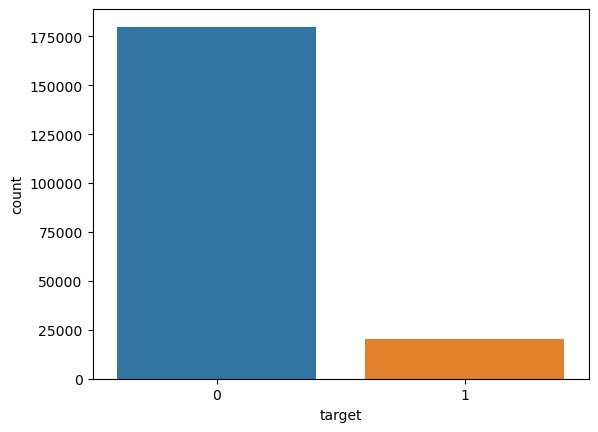

In [12]:
data['target'] = data['target'].astype('category')
sns.countplot(x=data.target)
plt.show()

In [13]:
print(data.target.dtype)
data['target'] = data['target'].astype('int64')

category


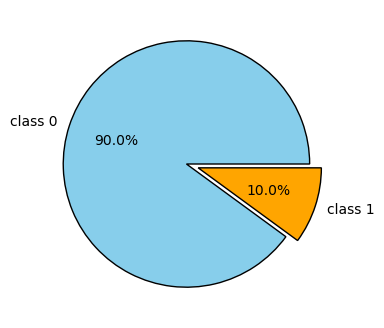

In [14]:
plt.figure(figsize=(4,4))
sizes = [179902,20098]
labels = ['class 0','class 1']
colors = ['skyblue','orange']

plt.pie(sizes,labels=labels,autopct='%1.1f%%',colors=colors,wedgeprops={'edgecolor':'black'},explode=[0,0.1])
plt.show()

#### - As we can see from the graph there is clear class imbalance in target variable as 'class 0' has 90% values and 'class 1' has only 10% values  

### Important Note

- In this data the features are anonymized because of which we've not done any Domain Analysis also we'll not perform any EDA .

### Distibution of Mean and Standard Deviation of data

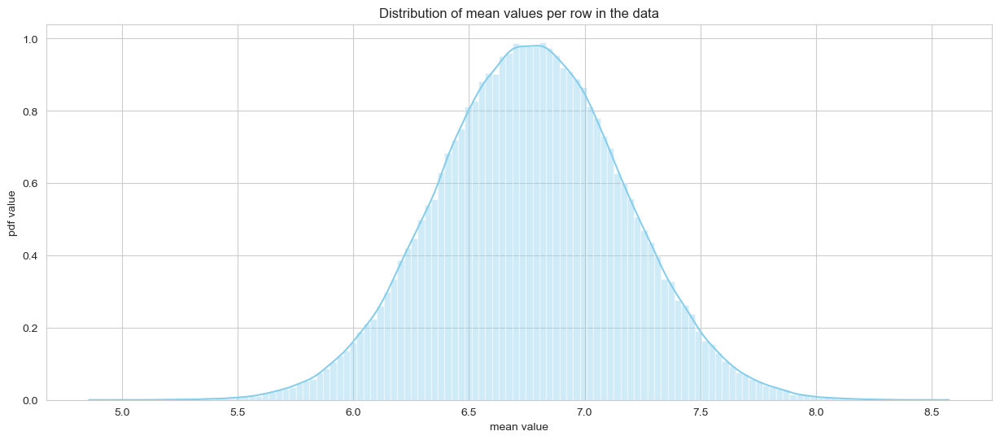

In [15]:
plt.figure(figsize=(15,6))
sns.set_style('whitegrid')
features = data.columns.values[1:201]
plt.title('Distribution of mean values per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(data[features].mean(axis=1),color='skyblue',kde=True,bins=120)
plt.show()

#### - From above graph the data is normally distirbuted and we can estimate that the mean value of data lies around 6.6 or 6.7

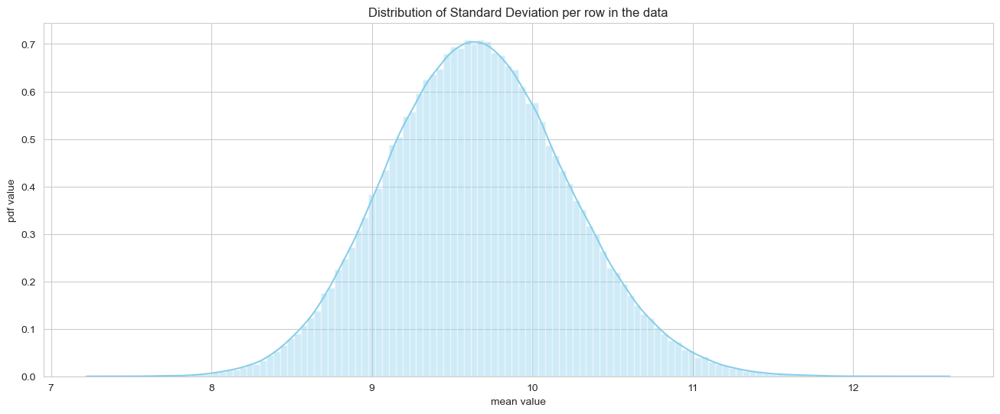

In [16]:
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
features = data.columns.values[1:202]
plt.title('Distribution of Standard Deviation per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(data[features].std(axis=1),color='skyblue', kde=True,bins=120)
plt.show()

#### - From above std deviation graph we can estimate that around 60% of data lies within std deviation range of 9-10 

## Feature Engineering and Preprocessing

In [17]:
# Checking for missing values 

In [18]:
data.isnull().sum()

target     0
var_0      0
var_1      0
var_2      0
var_3      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 201, dtype: int64

#### - As we can see there are no missing values in the data

## Outlier Handing 

#### - From above Statistical Analysis the features are very close to normal distribution also distance between data points is very less so we're not going to impute the Outliers.  

#### Instead we'll use Robust scaling for Outliers handling as well as Feature Scaling.

In [19]:
data.head(1)

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.093,11.4607,-9.2834,5.1187,18.6266,-4.92,...,4.4354,3.9642,3.1364,1.691,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914


## Feature Scaling

In [20]:
from sklearn.preprocessing import RobustScaler
rs = RobustScaler()
scaled_data = rs.fit_transform(data.drop('target',axis=1))


In [21]:
scaled_data

array([[-0.37154274, -0.84908135,  0.35003196, ..., -0.24222305,
        -0.74468274,  0.1077046 ],
       [ 0.22671251, -0.41636264,  0.86415539, ..., -0.07407684,
         0.57188564,  0.29736792],
       [-0.44500331, -0.18654128,  0.39546943, ..., -0.46303618,
        -0.28614943,  0.20043595],
       ...,
       [ 0.16226608, -0.56467415, -0.01773748, ..., -0.12883253,
        -0.49613639,  0.43745277],
       [-0.18817011, -1.14808195,  0.79868748, ...,  0.85490489,
        -0.0956665 , -0.69058025],
       [ 0.08164996, -0.67268166,  0.40543194, ..., -0.52405819,
        -0.89861335,  0.18435645]])

In [22]:
df = pd.DataFrame(scaled_data,columns=data.drop('target',axis=1).columns)

In [23]:
df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,-1.010902,-0.853215,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436
3,0.124444,-0.089159,-0.429020,0.120748,0.620850,0.247176,0.370517,-0.296912,-1.190060,0.313081,...,0.195359,-0.598020,-0.574591,-0.351340,1.065039,-0.548868,-0.627542,1.047370,0.480670,-0.385163
4,-0.159803,0.020439,0.604761,-0.061074,0.491579,0.600549,0.449607,0.541684,1.117206,0.024827,...,-0.726076,0.499102,-0.996298,1.031426,-0.979782,-0.669600,0.178488,0.458709,0.487211,-0.373372


Scaled Data Successfully.

## Feature Selection

### 1. Checking Correlation

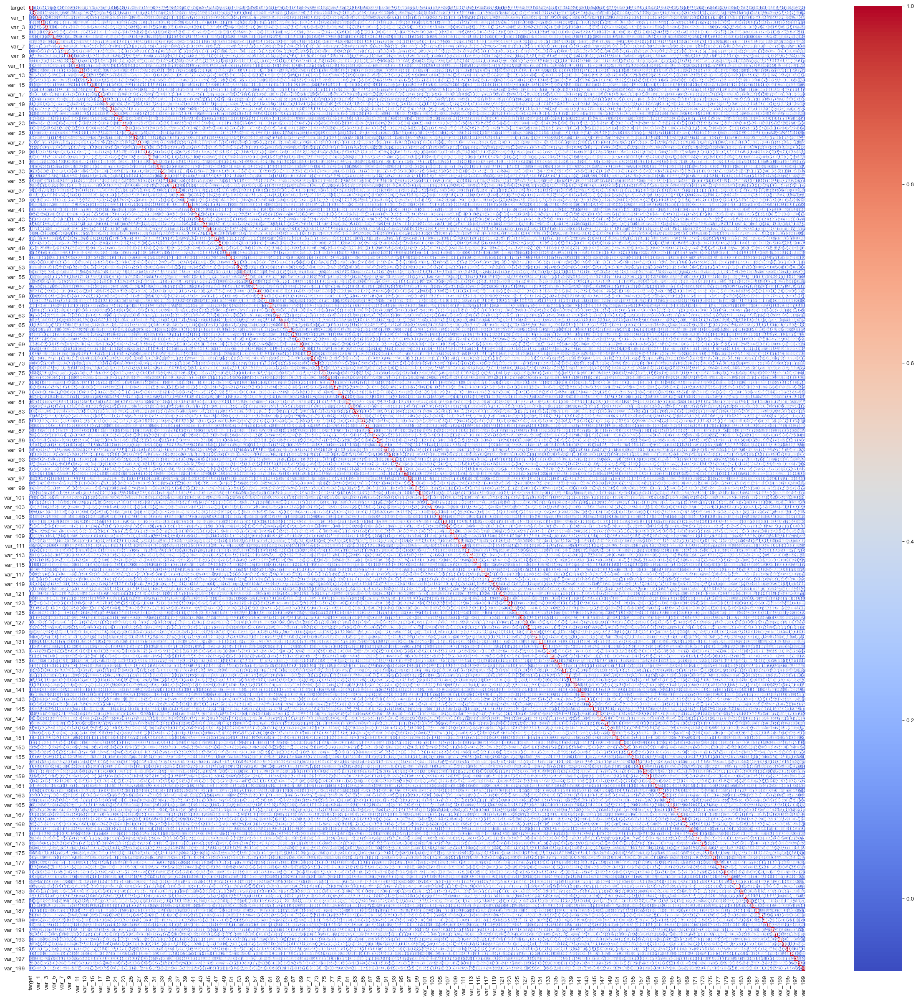

In [24]:
plt.figure(figsize=(30,30))
sns.heatmap(data.corr(),annot=True,cmap='coolwarm')
plt.show()

#### - As we can clearly see in the graph there is no highly correlated feature.
#### - But still we'll confirm it with setting a threshold by using python.

### 2. Checking Highly correlated features

In [25]:
def correlation(dataset, threshold):
    col_corr = set()
    corr_matrix = data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [26]:
corr_features = correlation(data,0.9)
len(set(corr_features))

0

#### - As per the above function and threshold we can see that there are no highly correlated features in the dataset. 

### 3. Checking for Duplicate values.

In [27]:
df.duplicated().sum()

0

#### - As we can see there are no duplicate values

### 4. Principal Component Analysis

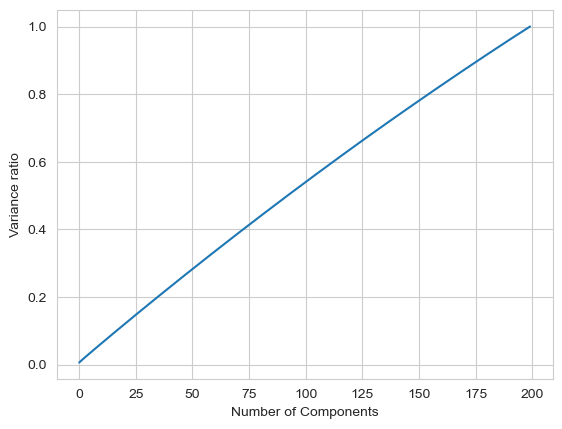

In [28]:
from sklearn.decomposition import PCA
pca = PCA()
pc = pca.fit_transform(df)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance ratio')
plt.show()

#### - From above graph we can see that the line of no. of components is straight which means almost all features are equally important in data. 

In [29]:
np.where(np.cumsum(pca.explained_variance_ratio_)>0.9)

(array([177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189,
        190, 191, 192, 193, 194, 195, 196, 197, 198, 199], dtype=int64),)

#### - So we'll select 175 components to avoid high variance loss

In [30]:
df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,...,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,...,0.686540,0.085795,0.331306,1.344064,-0.530228,1.103135,0.672394,-0.074077,0.571886,0.297368
2,-0.445003,-0.186541,0.395469,0.347815,-0.221094,-0.350556,1.260908,-0.356903,-1.010902,-0.853215,...,-0.046079,0.560891,-0.112102,-0.304303,0.764938,1.656951,-1.050161,-0.463036,-0.286149,0.200436
3,0.124444,-0.089159,-0.429020,0.120748,0.620850,0.247176,0.370517,-0.296912,-1.190060,0.313081,...,0.195359,-0.598020,-0.574591,-0.351340,1.065039,-0.548868,-0.627542,1.047370,0.480670,-0.385163
4,-0.159803,0.020439,0.604761,-0.061074,0.491579,0.600549,0.449607,0.541684,1.117206,0.024827,...,-0.726076,0.499102,-0.996298,1.031426,-0.979782,-0.669600,0.178488,0.458709,0.487211,-0.373372


In [31]:
pca = PCA(n_components=175)
new_data = pca.fit_transform(df)

num_components = 175

# Creating a function which will give all 175 PC's names.
column_names = [f'principal component {i}' for i in range(1, num_components + 1)]

principal_df = pd.DataFrame(data=new_data,columns = column_names)

In [32]:
principal_df = pd.concat([principal_df,data.target],axis=1)
principal_df

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10,...,principal component 167,principal component 168,principal component 169,principal component 170,principal component 171,principal component 172,principal component 173,principal component 174,principal component 175,target
0,-0.541324,0.206077,0.059825,-0.389029,-0.829034,-0.673619,-1.316975,-1.057517,0.865582,0.414710,...,-0.599979,-1.074453,0.356639,0.767813,-0.967735,-0.805763,0.876544,0.029677,-0.019166,0
1,1.380869,-0.360228,1.950155,1.311454,-0.345292,-0.054558,1.180367,-0.140102,-0.463410,0.618217,...,0.311604,1.242222,0.021100,-0.139036,-0.783516,0.286057,0.126546,-0.048230,-0.097300,0
2,0.054263,-0.819571,-0.314714,0.222354,0.009382,-0.149526,-0.105487,0.232775,0.767100,0.083284,...,0.711020,-0.201321,0.339948,0.560445,-0.587076,-0.853946,0.020063,-1.157271,-0.509355,0
3,1.419061,0.575213,0.415032,-0.604586,-0.387339,0.119356,1.266389,-0.163337,-0.623419,0.582696,...,0.720182,0.045399,-0.323968,0.187806,0.885055,-0.147753,-0.717219,0.508773,0.440280,0
4,0.644390,-0.067190,0.567382,-0.834723,0.157966,-0.401838,-0.678426,0.871065,0.353501,-0.469406,...,-0.481243,-0.027457,-1.469379,-0.278742,-0.156123,-0.095020,-0.236105,-0.585437,-0.160593,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,-0.192156,-0.798074,0.345190,0.290584,-1.292130,-0.250265,-1.291881,1.365595,0.497915,1.557252,...,-1.143918,-0.704222,0.204459,-0.170737,0.754787,-0.044414,-0.577770,0.076020,-0.792717,0
199996,-0.117111,-0.195036,-0.616238,1.046201,0.854360,-0.596515,1.461560,1.648350,-0.469222,-0.348958,...,-0.647574,0.194305,-0.541433,0.406645,0.250624,-0.949268,0.465131,-0.623293,1.703913,0
199997,-0.087655,0.536625,0.659403,0.823633,-0.988618,0.182958,0.076119,-0.529255,0.168196,0.974698,...,-0.517600,-0.658612,-0.674419,-0.284722,0.093420,-0.138642,0.127534,-0.403089,0.622128,0
199998,-0.441897,0.175747,0.402443,1.929700,-0.556686,-0.943700,0.132745,1.261342,0.699681,-0.938392,...,-0.356916,1.022696,-0.182732,0.089206,-0.216591,0.661733,-0.533356,0.110180,-0.757657,0


## Model Building

#### - Splitting data into dependant and independant variable.

In [33]:
x = principal_df.drop('target',axis=1)
y = principal_df['target']

In [34]:
x.shape

(200000, 175)

In [35]:
y.shape

(200000,)

#### - As we saw in above target column there is clear class imbalance.

In [36]:
data.target.value_counts()

target
0    179902
1     20098
Name: count, dtype: int64

## Balancing the Data using SMOTE

In [37]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [38]:
x_sm,y_sm = smote.fit_resample(x,y)

In [39]:
from collections import Counter
print('Unbalanced Data',Counter(y))
print('Balanced Data',Counter(y_sm))


Unbalanced Data Counter({0: 179902, 1: 20098})
Balanced Data Counter({0: 179902, 1: 179902})


## Splitting Data into Training and Testing

In [58]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_sm,y_sm,test_size=0.3,random_state=42)

# We're giving 30% data for testing because the size of data is large.

In [59]:
x_train.shape

(251862, 175)

In [60]:
y_train.shape

(251862,)

In [61]:
x_test.shape

(107942, 175)

In [62]:
y_test.shape

(107942,)

## 1. Logistic Regression

In [63]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(x_train,y_train)

LogisticRegression()

In [64]:
y_pred=LR.predict(x_test)
x_pred=LR.predict(x_train)

### Model Evaluation of Logistic Regression

In [65]:
from sklearn.metrics import accuracy_score,f1_score,classification_report

print("Training Accuracy",accuracy_score(x_pred,y_train))

print("Classification report of Training Data: \n",classification_report(x_pred,y_train))

Training Accuracy 0.7967061327234756
Classification report of Training Data: 
               precision    recall  f1-score   support

           0       0.79      0.80      0.79    123400
           1       0.81      0.79      0.80    128462

    accuracy                           0.80    251862
   macro avg       0.80      0.80      0.80    251862
weighted avg       0.80      0.80      0.80    251862



In [66]:
print("Testing Accuracy",accuracy_score(y_pred,y_test))
print("Classification report of Testing Data: \n",classification_report(y_pred,y_test))

Testing Accuracy 0.7955290804320839
Classification report of Testing Data: 
               precision    recall  f1-score   support

           0       0.79      0.80      0.79     53125
           1       0.80      0.79      0.80     54817

    accuracy                           0.80    107942
   macro avg       0.80      0.80      0.80    107942
weighted avg       0.80      0.80      0.80    107942



#### - As we can see both training and testing classification reports are not good. Improvement required.

### Using Bagging on Logistic Regression

In [67]:
log_reg = LogisticRegression()
from sklearn.ensemble import BaggingClassifier

bagg = BaggingClassifier(base_estimator=log_reg,n_estimators=50)

bagg.fit(x_train,y_train)
bagg_predict = bagg.predict(x_test)

In [68]:
print("Accuracy score using bagging",accuracy_score(bagg_predict,y_test))
print("Classification_report of bagging testing data: \n",classification_report(bagg_predict,y_test))

Accuracy score using bagging 0.7952604176316911
Classification_report of bagging testing data: 
               precision    recall  f1-score   support

           0       0.79      0.80      0.79     53150
           1       0.80      0.79      0.80     54792

    accuracy                           0.80    107942
   macro avg       0.80      0.80      0.80    107942
weighted avg       0.80      0.80      0.80    107942



#### - As we can see scores are not improving even after using bagging

## 2. XGB Classifier

In [69]:
import xgboost
from xgboost import XGBClassifier

xgb = XGBClassifier()

xgb.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [70]:
x_tr_pred = xgb.predict(x_train)
x_ts_pred = xgb.predict(x_test)

### Evaluation

In [71]:
print("Training Accuracy using XGB Classifier:",accuracy_score(x_tr_pred,y_train))
print("Classification report: \n",classification_report(x_tr_pred,y_train))

Training Accuracy using XGB Classifier: 0.921786533895546
Classification report: 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92    125101
           1       0.92      0.92      0.92    126761

    accuracy                           0.92    251862
   macro avg       0.92      0.92      0.92    251862
weighted avg       0.92      0.92      0.92    251862



In [72]:
print("Testing Accuracy using XGB Classifier:",accuracy_score(x_ts_pred,y_test))
print("Classification report: \n",classification_report(x_ts_pred,y_test))

Testing Accuracy using XGB Classifier: 0.8868836968001335
Classification report: 
               precision    recall  f1-score   support

           0       0.88      0.89      0.89     53186
           1       0.89      0.88      0.89     54756

    accuracy                           0.89    107942
   macro avg       0.89      0.89      0.89    107942
weighted avg       0.89      0.89      0.89    107942



#### We can see now after aplying XGBoost Classifier both training and testing accuracy has improve.

#### Still we'll try ANN(MLP classifier) to check whether it is giving even good result or not.

In [73]:
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=100,
                      random_state=42)

In [74]:
model.fit(x_train,y_train)

MLPClassifier(hidden_layer_sizes=(60, 3), max_iter=100, random_state=42)

In [75]:
mlp_prdict_probability = model.predict_proba(x_test)
mlp_prdict_probability

array([[0.99722471, 0.00277529],
       [0.26080639, 0.73919361],
       [0.00603917, 0.99396083],
       ...,
       [0.00289184, 0.99710816],
       [0.99542265, 0.00457735],
       [0.93924835, 0.06075165]])

In [78]:
# Step:4 Prediction on test data
mlp_test_predict = model.predict(x_test)

# Step:5 Prediction on training data
mlp_train_predict = model.predict(x_train)

In [80]:
mlp_train_accuracy = accuracy_score(mlp_train_predict,y_train)
print("Training accuracy of MLP model is:",mlp_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(mlp_train_predict,y_train))

Training accuracy of MLP model is: 91.95075080798215
Classification report of training:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92    126637
           1       0.92      0.92      0.92    125225

    accuracy                           0.92    251862
   macro avg       0.92      0.92      0.92    251862
weighted avg       0.92      0.92      0.92    251862



In [79]:
mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
print("Testing accuracy of MLP model is:",mlp_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 88.33632876915381
Classification report of testing:
               precision    recall  f1-score   support

           0       0.88      0.89      0.88     53634
           1       0.89      0.88      0.88     54308

    accuracy                           0.88    107942
   macro avg       0.88      0.88      0.88    107942
weighted avg       0.88      0.88      0.88    107942



After applying MLP Classifier the accuracy remains same. 

## NOTE :

- From above XGBoost and MLPClassifier model we can see that the score is improved. I've tried using Hyperparameter Tuning but the data is very large that's why it takes more time to fit the data. So I remove all the hyperparameters and applied the model.

## Report on Challenges Faced 

1. The data had 200 features means the data was quite large, which was making the overall execution of each step a liitle time consuming.
2. Anonymized features were making it harder for feature selection.
3. There was clear class imbalance so I've used smoting.
4. For feature selection I've tried using heatmap , setting threshold for highly correlated features but the data was very well normally distributed and features had almost equal correlationamong each other that's why I went with PCA.
5. Before applying PCA I also handle outliers and perform scaling in one step which was using Robust Scaling.
6. Because Standard Scaler was not good option for scaling .
7. In model building part I analyzed that normal Logistic Regression was not giving good results. Also after applying Bagging on that was not improving the scores.
8. So I tried implementing XGBoost Classifier and ANN MLP Classifier which gave me very good results .
9. Final Conslusion Either we can go with XGBoost Classifier or ANN MLP Classifier for this data.

## Model Comparison Report :

- Logistic Regression model is not giving good score. Even after applying Bagging on logistic regression score is still same.
- XGB Classifier model is working good with data as it is giving training acuuracy score:91.95 and also the f1-score:0.92 also the testing score:88.33 and f1-score:0.88  
- ANN MLP Classifier is also giving the same result not improving any score further.

## Conclusion :

- From above all models we can use ANN MLP Classifier as it is giving the good result for data.
- Also in XGB we've not used any hyperparameters but in MLP Classifier we've used certain Hyperparameters that's why we can go with ANN MLP Classifier.

In [81]:
# saving model with the help of pickle
import pickle

file = open('mlp_classifier_model.pkl','wb')
pickle.dump(model,file)